@author: Valentin Larrieu

# RNN on Back music
# Training language model (Many-to-Many) and generating sequences (One-to-Many)


### Objective:

- We will train a network to learn a language model and then use it to generate new sequences.

- Instead of training the language model on text-documents (as it is the case in most examples) we will train it to learn the language of the music of [Johann_Sebastian_Bach](https://en.wikipedia.org/wiki/Johann_Sebastian_Bach).
For this, we will learn how J. S. Bach's "Cello suite" hav been composed.
Here is an example of a "Cello suite" [Link](https://www.youtube.com/watch?v=mGQLXRTl3Z0).

- Rather than analyzing the audio signal, we use a symbolic representation of the "Cello suite" through their [MIDI files](https://en.wikipedia.org/wiki/MIDI#MIDI_files).
  - A MIDI file encodes in a file, the set of musical notes, their duration, and intensity which have to be played by each instrument to "render" a musical piece. The "rendering" is usually operated by a MIDI synthesizer (such as VLC, QuickTime).

- We will first train a language model on the whole set of MIDI files of the "Cello suites". 
- We will then sample this language model to create a new MIDI file which will be a brand new "Cello suite" composed by the computer.

### Questions:

In the bottom part of this lab, you will have to answer a set of questions. Answers to those only necessitates a couple of sentences.

## Import packages

In [0]:
import os
import pretty_midi
from scipy.io import wavfile 
import IPython

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, LSTM, Flatten, Dropout, Activation
from tensorflow.keras import backend as K

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import glob

In [0]:
n_x = 79
max_T_x = 1000
sequence_length = 50
T_y_generated = 400

## Collect data to create the language model

We download the 36 MIDI files corresponding to the 36 "Cello suites" composed by J. S. Bach.

In [103]:
DIR = './'
import urllib.request
midiFile_l = ['cs1-2all.mid', 'cs5-1pre.mid', 'cs4-1pre.mid', 'cs3-5bou.mid', 'cs1-4sar.mid', 'cs2-5men.mid', 'cs3-3cou.mid', 'cs2-3cou.mid', 'cs1-6gig.mid', 'cs6-4sar.mid', 'cs4-5bou.mid', 'cs4-3cou.mid', 'cs5-3cou.mid', 'cs6-5gav.mid', 'cs6-6gig.mid', 'cs6-2all.mid', 'cs2-1pre.mid', 'cs3-1pre.mid', 'cs3-6gig.mid', 'cs2-6gig.mid', 'cs2-4sar.mid', 'cs3-4sar.mid', 'cs1-5men.mid', 'cs1-3cou.mid', 'cs6-1pre.mid', 'cs2-2all.mid', 'cs3-2all.mid', 'cs1-1pre.mid', 'cs5-2all.mid', 'cs4-2all.mid', 'cs5-5gav.mid', 'cs4-6gig.mid', 'cs5-6gig.mid', 'cs5-4sar.mid', 'cs4-4sar.mid', 'cs6-3cou.mid']
for midiFile in midiFile_l:
  #if os.path.isfile(DIR + midiFile) is None:
  urllib.request.urlretrieve ("http://www.jsbach.net/midi/" + midiFile, DIR + midiFile)
nbExample = len(midiFile_l)

midiFile_l = glob.glob(DIR + 'cs*.mid')
print(midiFile_l)

['./cs2-5men.mid', './cs2-3cou.mid', './cs5-1pre.mid', './cs5-5gav.mid', './cs6-2all.mid', './cs1-6gig.mid', './cs4-6gig.mid', './cs4-1pre.mid', './cs3-3cou.mid', './cs3-2all.mid', './cs4-4sar.mid', './cs2-2all.mid', './cs3-6gig.mid', './cs4-3cou.mid', './cs2-4sar.mid', './cs6-6gig.mid', './cs2-1pre.mid', './cs5-2all.mid', './cs3-4sar.mid', './cs5-4sar.mid', './cs1-4sar.mid', './cs2-6gig.mid', './cs6-4sar.mid', './cs1-1pre.mid', './cs6-5gav.mid', './cs3-5bou.mid', './cs6-3cou.mid', './cs6-1pre.mid', './cs4-5bou.mid', './cs5-6gig.mid', './cs1-2all.mid', './cs5-3cou.mid', './cs1-5men.mid', './cs4-2all.mid', './cs1-3cou.mid', './cs3-1pre.mid']


## Read and convert all MIDI files

We read all MIDI files and convert their content to one-hot-encoding matrix X_ohe of dimensions (T_x, n_x) where n_x is the number of possible musical notes.
The duration of the sequences T_x can vary from one sequence to the other.
 


In [104]:
# We truncate the duration of each example to the first T_x data

X_list = []

for midiFile in midiFile_l:
    # read the MIDI file
    midi_data = pretty_midi.PrettyMIDI(midiFile)
    note_l = [note.pitch for note in midi_data.instruments[0].notes]
    # convert to one-hot-encoding
    T_x = len(note_l)
    if T_x > max_T_x:
      T_x = max_T_x
    X_ohe = np.zeros((T_x, n_x))
    for t in range(T_x): 
      X_ohe[t, note_l[t]-1] = 1
    # add to the list  
    X_list.append(X_ohe)
    
print(len(X_list))
print(X_list[0].shape)
print(X_list[1].shape)
print(X_list[2].shape)

36
(489, 79)
(580, 79)
(879, 79)


## Display the set of notes over time for a specific track 

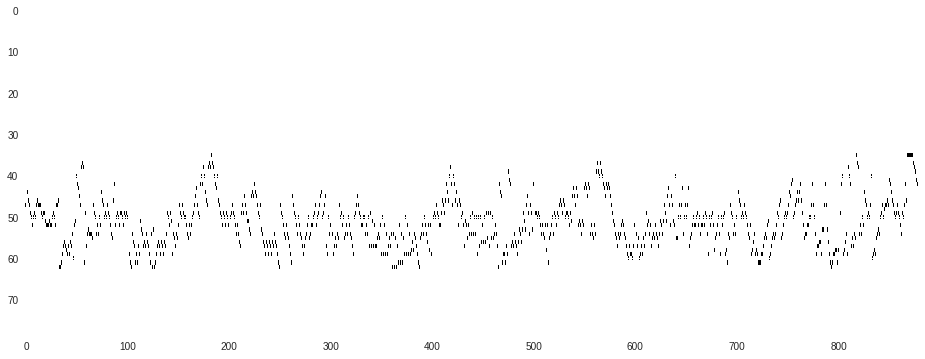

In [105]:
plt.figure(figsize=(16, 6))
plt.imshow(X_list[2].T, aspect='auto')
plt.set_cmap('gray_r')
plt.grid(True)

## Data conversion for the training of language model

For each example/sequence and each possible starting note in this example/sequence, we create two sequences
- an input sequence: 
  - which contains a sub-sequence of length ```sequence_length```;  this sub-sequence range from the note $t$ to the note $t+sequence\_length-1$
- an output sequence:
  - which contains the following note to be predicted, the one at position $t+sequence\_length$

The training is therefore performed by giving to the model a set of sequences as input and asking the network to predict each time the note that should come right after this sequence.

In [106]:
X_train_list = []
y_train_list = []

# CODE-RNN2-1
# --- START CODE HERE
for index in range(len(X_list)):
  for time in range(len(X_list[index]) - sequence_length):
    X_train_list.append(X_list[index][time:sequence_length + time])
    y_train_list.append(X_list[index][time + sequence_length])
# --- END CODE HERE

X_train = np.asarray(X_train_list)
y_train = np.asarray(y_train_list)

print("X_train.shape:", X_train.shape)
print("y_train.shape:", y_train.shape)

X_train.shape: (22701, 50, 79)
y_train.shape: (22701, 79)


# Training the language model

The language model will be learned by training an RNN with input ```X_train``` and output ```Y_train```:  for each of the examples of sequences, we give to the network a sequence of notes of ```sequence_length``` duration, and ask the network to predict the following note of each sequence.

The network will have the following structure
- a layer of ```LSTM``` with $n_a$=256
- a DropOut layer with rate 0.3 (the probability to "drop-out" one neuron is 0.3)
- a second layer of ```LSTM``` with $n_a$=256
- a DropOut layer with rate 0.3 (the probability to "drop-out" one neuron is 0.3)
- a ```Dense``` layer with 256 units
- a DropOut layer with rate 0.3 (the probability to "drop-out" one neuron is 0.3)
- a ``Dense``` layer with a ```softmax``` activation which predict the probability of each of the $n_x$ notes as output

Note that because we will stack two LSTM layers on top of each other (deep-RNN), we need to tell the first LSTM to output its hidden states at each time $t$. This is done by the option ```return_sequences=True``` that has to be given to the first LSTM.

This is not the case of the second LSTM since we are only interrest in its final prediction (hence ```return_sequences=False``` which is the default behaviour).

In [107]:
# create the model
K.clear_session()

# CODE-RNN2-2
# --- START CODE HERE
size_LSTM = 512

# We create our model and use a TPU for faster calculation
model = Sequential()


######## Sequencial implementation

#model = Sequential()
model.add(LSTM(size_LSTM, return_sequences=True, batch_input_shape=(None, sequence_length, n_x)))
model.add(Dropout(0.15))
model.add(LSTM(size_LSTM, return_sequences=True))
model.add(Dropout(0.15))
model.add(LSTM(size_LSTM, return_sequences=True))
model.add(Dropout(0.15))
model.add(LSTM(size_LSTM, return_sequences=True))
model.add(Dropout(0.15))
model.add(LSTM(size_LSTM))
model.add(Dense(size_LSTM))
model.add(Dropout(0.15))
model.add(Dense(n_x, activation='softmax'))

model =  tf.contrib.tpu.keras_to_tpu_model(
   model,
   strategy=tf.contrib.tpu.TPUDistributionStrategy(
       tf.contrib.cluster_resolver.TPUClusterResolver(
           tpu='grpc://' + os.environ['COLAB_TPU_ADDR'])
   )
)
######## Fonctionnal implementation

"""
inputs = Input(shape=(20,79))
x = LSTM(size_LSTM,return_sequences=True)(inputs)
x = Dropout(0.3)(x)
x = LSTM(size_LSTM)(x) 
x = Dropout(0.3)(x)
x = Dense(size_LSTM)(x)
x = Dropout(0.3)(x)
output = Dense(n_x,  activation='softmax')(x)
model = Model(inputs=inputs, outputs = output)
"""

# --- END CODE HERE

print(model.summary())

INFO:tensorflow:Querying Tensorflow master (grpc://10.42.66.130:8470) for TPU system metadata.
INFO:tensorflow:Found TPU system:
INFO:tensorflow:*** Num TPU Cores: 8
INFO:tensorflow:*** Num TPU Workers: 1
INFO:tensorflow:*** Num TPU Cores Per Worker: 8
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, -1, 13955966498322227305)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 12428709453045172593)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 14659809052022095293)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 8991087069707892120)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 8953335493379001175)
INFO:tensorflow:*** Available Device: _DeviceAttributes

In [108]:
model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=120, batch_size=64)

Epoch 1/120
INFO:tensorflow:New input shapes; (re-)compiling: mode=train (# of cores 8), [TensorSpec(shape=(8,), dtype=tf.int32, name='core_id0'), TensorSpec(shape=(8, 50, 79), dtype=tf.float32, name='lstm_input_10'), TensorSpec(shape=(8, 79), dtype=tf.float32, name='dense_1_target_10')]
INFO:tensorflow:Overriding default placeholder.
INFO:tensorflow:Cloning RMSprop {'lr': 0.0010000000474974513, 'rho': 0.8999999761581421, 'decay': 0.0, 'epsilon': 1e-07}
INFO:tensorflow:Remapping placeholder for lstm_input
INFO:tensorflow:KerasCrossShard: <tensorflow.python.keras.optimizers.RMSprop object at 0x7f38a94e91d0> []
INFO:tensorflow:Started compiling
INFO:tensorflow:Finished compiling. Time elapsed: 16.44823408126831 secs
INFO:tensorflow:Setting weights on TPU model.
INFO:tensorflow:CPU -> TPU lr: 0.0010000000474974513 {0.001}
INFO:tensorflow:CPU -> TPU rho: 0.8999999761581421 {0.9}
INFO:tensorflow:CPU -> TPU decay: 0.0 {0.0}
22592/22701 [============================>.] - ETA: 0s - loss: 3.161

# Generating a new sequence from sampling the language model

To generate a new sequence from the language model, we simply give it as input a random sequence of duration ```sequence_length```and ask the trained network to predict the output (using ```model.predict```). 

The output of the network is a vector of probability of dimension $n_x$ which represents the probability of each note to be the next note of the melody given as input.

From this vector, we select the note which has the maximum probability.

We then concatenate this new note (its one-hot-encoding representation) at the end of the input sequence.
We finally remove the first element of the input sequence to keep its duration constant (```sequence_length```).

Instead of providing a random sequence as input, we rather randomly select one sequence out of the 2880 sequences used for training.
We denote it by ```pattern```.



In [109]:
# --- select a random starting pattern
start = np.random.randint(0, len(X_train_list)-1)
pattern = X_train_list[start]
print(start)
print(pattern.shape)
print(np.expand_dims(pattern, 0).shape)

15980
(50, 79)
(1, 50, 79)


In [110]:
# Convert back the model in CPU for prediction (if not, we get an error of batchsize need to be a multiple of TPU cores)
model = model.sync_to_cpu()

note_l = []

def ohe_note(note):
  X_ohe = np.zeros((n_x,))
  X_ohe[note-1] = 1
  return X_ohe    

prediction_l = [model.predict(np.expand_dims(pattern, 0))]
note_l.append(np.argmax(prediction_l[0])+1) # we decode the one hot encoding

# generate T_y_generated notes
for note_index in range(1,T_y_generated):
  # CODE-RNN2-3
  # --- START CODE HERE
  if note_index < pattern.shape[0] + 1: # If we have enough element to take
     pattern_selec = pattern[note_index:sequence_length]
     # We generate our prediction and reshape it to have the good size
     prediction = np.array(prediction_l[0:note_index]).reshape(note_index,n_x)
     # We append the part of the patern and our selected prediction
     pattern_selec = np.append(pattern_selec, prediction, axis=0)
     # We need to add one dimention to our object to get the good shape
     pattern_selec = np.expand_dims(pattern_selec, 0)
  else:
     pattern_selec = np.array(prediction_l[note_index-sequence_length:]).reshape(1,sequence_length,n_x)
  
  # We append the model prediction
  prediction_l.append(model.predict(pattern_selec))
  # We append the note we generated
  note_l.append(np.argmax(prediction_l[note_index])+1) # We decode the one hot encoding and add it to our list
  # --- END CODE HERE


INFO:tensorflow:Copying TPU weights to the CPU
INFO:tensorflow:TPU -> CPU lr: 0.0010000000474974513
INFO:tensorflow:TPU -> CPU rho: 0.8999999761581421
INFO:tensorflow:TPU -> CPU decay: 0.0
INFO:tensorflow:TPU -> CPU epsilon: 1e-07


### Display the generated sequence

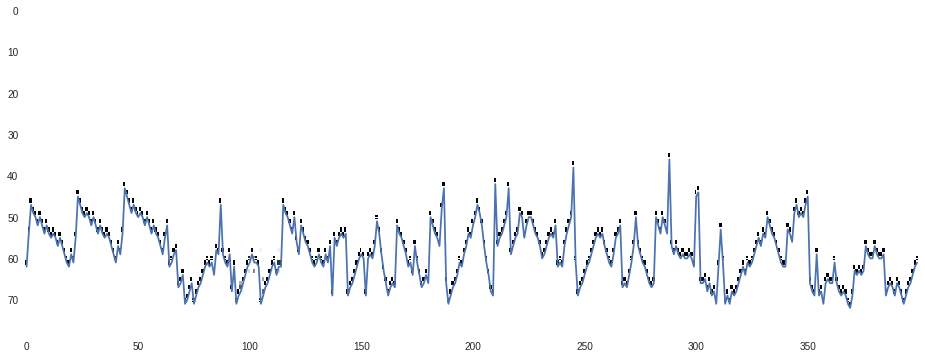

In [111]:
#print(note_l)

plt.figure(figsize=(16, 6))
plt.imshow(np.asarray(prediction_l)[:,0,:].T, aspect='auto')
plt.plot(note_l)
plt.set_cmap('gray_r')
plt.grid(True)


### Create a MIDI file and an audio file which correspond to the generated sequence

Once the new sequence has been generated (```note_l```) we transform it to a new MIDI file and perform (a very cheap) rendering of it in an audio file.

In [112]:
new_midi_data = pretty_midi.PrettyMIDI()
cello_program = pretty_midi.instrument_name_to_program('Cello')
cello = pretty_midi.Instrument(program=cello_program)
time = 0
step = 0.3
for note_number in note_l:
    myNote = pretty_midi.Note(velocity=100, pitch=note_number, start=time, end=time+step)
    cello.notes.append(myNote)
    time += step
new_midi_data.instruments.append(cello)
%matplotlib inline

audio_data = new_midi_data.synthesize()
IPython.display.Audio(audio_data, rate=44100)

#new_midi_data.write("test.mid")


In [113]:
# Writing to the drive
from google.colab import drive
drive.mount('drive')
#print(os.listdir('drive/My Drive/Google Colab'))
new_midi_data.write("drive/My Drive/Google Colab/LSTM Back/LSTM_T4.mid")

Drive already mounted at drive; to attempt to forcibly remount, call drive.mount("drive", force_remount=True).


# Explanation and Improvement

We decided to implement a LSTM to avoid some of the RNN problem as Vanishing or exploding gradient.

Our case here is a many to one, we use a sequence of notes to produce one note at a time (We predict note by note). Here, many to one only uses its own predictions once the number of notes predicted equals the sequence size.

When training language models with RNN, embeding is most often used to bring the close elements closer together in the projection space. This way, we can then use this space to predict our exits.

We could use a many to many that creates a predicted sequence based on the initial sequence. A disadvantage of this type of technique is the training time it may require.


**Shortning sequence**

Shortening the sequences will reduce the importance of the temporal relationships taken into account. Imagine that we increase the number of notes taken from 20 to 10, instead of taking into account the relationships between the 20 notes, the network would see two sequences of 10 so we would lose some form of important relationship in this sequential domain. To overcome this phenomenon, using a sliding window allows to keep the relationships that would be lost if the sequences were processed individually.

Reducing the window will capture less variance so you may be more likely to get stuck in an endless sequence.

To avoid this kind of problem, we could change the type of compression of the sequence to get more information while having a smaller sequence. We are also thinking of using techniques such as attention models.


**Turning the model to polyphonic**

To make the system polyphonic, it would be necessary to change the encoding of the data via the one hot encoder. Thus, instead of having only one 0 per column denoting the score, we could have several 1s in the same column. It would also be necessary to change the prediction system since it selects the highest probability here so it cannot predict several scores. One might consider using a threshold value so that several notes can be predicted by the model. It is therefore also necessary to change the activation function.
